In [1]:
import pandas as pd


In [2]:
df = pd.read_csv("/Users/ismailbhamjee/Documents/hadith nlp/pdf_breakdown/sents.csv")

In [3]:
df

,number,sents,text_enpunct,sents_tokenized,sents_nonstop,sents_stemmed,hadith_lemmatized
0,0,etymology of the name of andalue—climate—geogr...,etymology of the name of andalueclimategeograp...,"['etymology', 'of', 'the', 'name', 'of', 'anda...","['etymology', 'name', 'andalueclimategeographi...","['etymolog', 'name', 'andalueclimategeograph',...","['etymolog', 'name', 'andalueclimategeograph',..."
1,0,"in the name of god, whose assistance we humbly...",in the name of god whose assistance we humbly ...,"['in', 'the', 'name', 'of', 'god', 'whose', 'a...","['name', 'god', 'whose', 'assistance', 'humbly...","['name', 'god', 'whose', 'assist', 'humbl', 'b...","['name', 'god', 'whose', 'assist', 'humbl', 'b..."
2,1,"for our part, we consider andalus as the priz...",for our part we consider andalus as the prize...,"['', 'for', 'our', 'part', 'we', 'consider', '...","['', 'part', 'consider', 'andalus', 'prize', '...","['', 'part', 'consid', 'andalu', 'prize', 'rac...","['', 'part', 'consid', 'andalu', 'prize', 'rac..."
3,0,especting the etymology of its name different ...,especting the etymology of its name different ...,"['especting', 'the', 'etymology', 'of', 'its',...","['especting', 'etymology', 'name', 'different'...","['espect', 'etymolog', 'name', 'differ', 'opin...","['espect', 'etymolog', 'name', 'differ', 'opin..."
4,1,"” who settled in it, and gave it his name, in...",who settled in it and gave it his name in li...,"['', 'who', 'settled', 'in', 'it', 'and', 'gav...","['', 'settled', 'gave', 'name', 'like', 'manne...","['', 'settl', 'gave', 'name', 'like', 'manner'...","['', 'settl', 'gave', 'name', 'like', 'manner'..."
...,...,...,...,...,...,...,...
4014,1,‘‘ most of the historians of this country see...,most of the historians of this country seem ...,"['', 'most', 'of', 'the', 'historians', 'of', ...","['', 'historians', 'country', 'seem', 'enterta...","['', 'historian', 'countri', 'seem', 'entertai...","['', 'historian', 'countri', 'seem', 'entertai..."
4015,2,"there can be no doubt, however, that he was a...",there can be no doubt however that he was a m...,"['', 'there', 'can', 'be', 'no', 'doubt', 'how...","['', 'doubt', 'however', 'mauli', 'abdul', 'az...","['', 'doubt', 'howev', 'mauli', 'abdul', 'aziz...","['', 'doubt', 'howev', 'mauli', 'abdul', 'aziz..."
4016,3,"his “« posterity, however, were famous for t...",his posterity however were famous for the c...,"['', 'his', 'posterity', 'however', 'were', 'f...","['', 'posterity', 'however', 'famous', 'comman...","['', 'poster', 'howev', 'famou', 'command', 'h...","['', 'poster', 'howev', 'famou', 'command', 'h..."
4017,4,NaN,NaN,[''],[''],[''],['']


In [4]:
x = df['hadith_lemmatized'].values.tolist()

In [5]:
len(x)

4019

In [6]:
import nltk

In [7]:
corpus=x
tok_corp = [nltk.word_tokenize(sent) for sent in corpus] #creates a corpus

In [8]:
from gensim import corpora, models, similarities 

In [9]:
import gensim

In [10]:
from scipy.cluster.hierarchy import dendrogram, linkage

In [11]:
import numpy as np

In [12]:
from matplotlib import pyplot as plt

In [14]:
#from scipy.cluster.hierarchy import fcluster
#label = fcluster(linked,numclust,criterion='maxclust')

In [15]:
pd.set_option("display.max_rows", None)

In [16]:
import gensim
from gensim.models import Doc2Vec

In [23]:
LabeledSentence1 = gensim.models.doc2vec.TaggedDocument
all_content_train = []
j=0
for em in df['hadith_lemmatized'].values:
    all_content_train.append(LabeledSentence1(em,[j]))
    j+=1
print("Number of texts processed: ", j)


Number of texts processed:  4019


In [24]:
model = gensim.models.doc2vec.Doc2Vec(vector_size=50, min_count=1, epochs=5) #model parameters need updating
model.build_vocab(all_content_train)
model.train(all_content_train, total_examples=model.corpus_count, epochs=model.epochs)


In [40]:
len(model.dv[1])

50

In [41]:
from scipy.cluster.vq import kmeans,vq

In [48]:
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.cluster.hierarchy import ward, dendrogram

In [60]:
linkage_matrix = ward(model.dv.vectors)

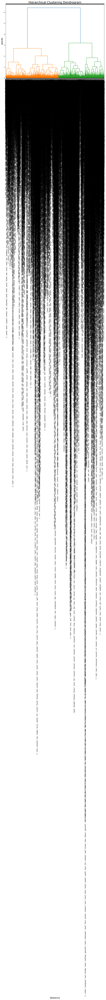

<Figure size 640x480 with 0 Axes>

In [96]:
fig, ax = plt.subplots(figsize=(12, 9)) # set size
ax = dendrogram(linkage_matrix, orientation="top", leaf_font_size=10,leaf_label_func=lambda v: str(x[v]));

plt.tick_params(\
    axis= 'x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom='off',      # ticks along the bottom edge are off
    top='off',         # ticks along the top edge are off
    labelbottom='off')
plt.title('Hierarchical Clustering Dendrogram', fontsize=20)
plt.ylabel('words', fontsize=16)
plt.xlabel('distance', fontsize=16)
plt.show() #show plot with tight layout

#uncomment below to save figure
plt.savefig('ward_clusters- fast text.png', dpi=300)



In [97]:
from scipy.cluster.hierarchy import fcluster
assignments = fcluster(linkage(matrix, method='complete'),0.12,'distance')

print (assignments)

cluster_output = pd.DataFrame({'word':labels2 , 'cluster':assignments})
print(cluster_output)

[ 303 2100 1004 ... 2150 2089  684]
      word  cluster
0        0      303
1        1     2100
2        2     1004
3        3     2349
4        4     1429
5        5      326
6        6     2604
7        7      704
8        8      665
9        9     2369
10      10      279
11      11       62
12      12      500
13      13      700
14      14      235
15      15     1796
16      16     2385
17      17     2178
18      18      130
19      19     2134
20      20      736
21      21     2533
22      22     2517
23      23     2011
24      24      230
25      25      695
26      26      870
27      27      272
28      28     2503
29      29     2676
30      30     1392
31      31     1065
32      32      943
33      33      738
34      34      597
35      35     1346
36      36     2544
37      37      564
38      38      143
39      39     1297
40      40     2128
41      41      917
42      42      683
43      43       46
44      44     2523
45      45     1775
46      46      288
47  

In [ ]:
df_list= pd.DataFrame()
df_list['text']=labels2
df_list['lable']=assignments

In [98]:
model.dv.vocab

AttributeError: The vocab attribute was removed from KeyedVector in Gensim 4.0.0.
Use KeyedVector's .key_to_index dict, .index_to_key list, and methods .get_vecattr(key, attr) and .set_vecattr(key, attr, new_val) instead.
See https://github.com/RaRe-Technologies/gensim/wiki/Migrating-from-Gensim-3.x-to-4

In [64]:
matrix = model.dv.vectors

In [67]:
labels2 = model.dv.index_to_key

In [65]:
from scipy.cluster.hierarchy import fcluster
assignments = fcluster(linkage(matrix, method='complete'),0.12,'distance')

print (assignments)

cluster_output = pd.DataFrame({'word':labels2 , 'cluster':assignments})
print(cluster_output)

[ 303 2100 1004 ... 2150 2089  684]


ValueError: All arrays must be of the same length

values passed to leaf_label_func
leaves :  [2450, 1290, 3395, 388, 663, 422, 3324, 2776, 2588, 2847, 336, 416, 2417, 1004, 815, 800, 3974, 1260, 2593, 446, 3612, 275, 55, 2418, 751, 2058, 123, 767, 762, 2616, 444, 742, 3709, 1383, 1052, 3291, 1718, 3604, 829, 1490, 2554, 2710, 513, 1425, 2206, 1822, 3618, 1622, 1372, 2439, 144, 2961, 3394, 3972, 2066, 189, 3971, 251, 2973, 2160, 2320, 1956, 3305, 2243, 3175, 3622, 113, 753, 1849, 1829, 1249, 1722, 1017, 3511, 3375, 3858, 2061, 734, 839, 34, 3317, 3494, 2229, 3539, 2476, 3606, 516, 3417, 314, 2227, 589, 1624, 3028, 1259, 3537, 2682, 3467, 587, 3570, 3558, 3691, 3920, 3874, 1885, 2906, 805, 3983, 356, 1813, 2367, 382, 1336, 1334, 2533, 359, 3607, 89, 3979, 3384, 1345, 1798, 648, 1543, 1192, 2214, 1922, 2018, 3783, 2303, 3816, 2491, 168, 1328, 756, 2893, 774, 673, 828, 3482, 1516, 3453, 2457, 2669, 467, 727, 3139, 549, 2816, 3664, 3722, 493, 3387, 324, 1302, 2349, 1577, 3964, 630, 2067, 2406, 427, 646, 723, 1842, 465, 1725, 2604, 868, 226

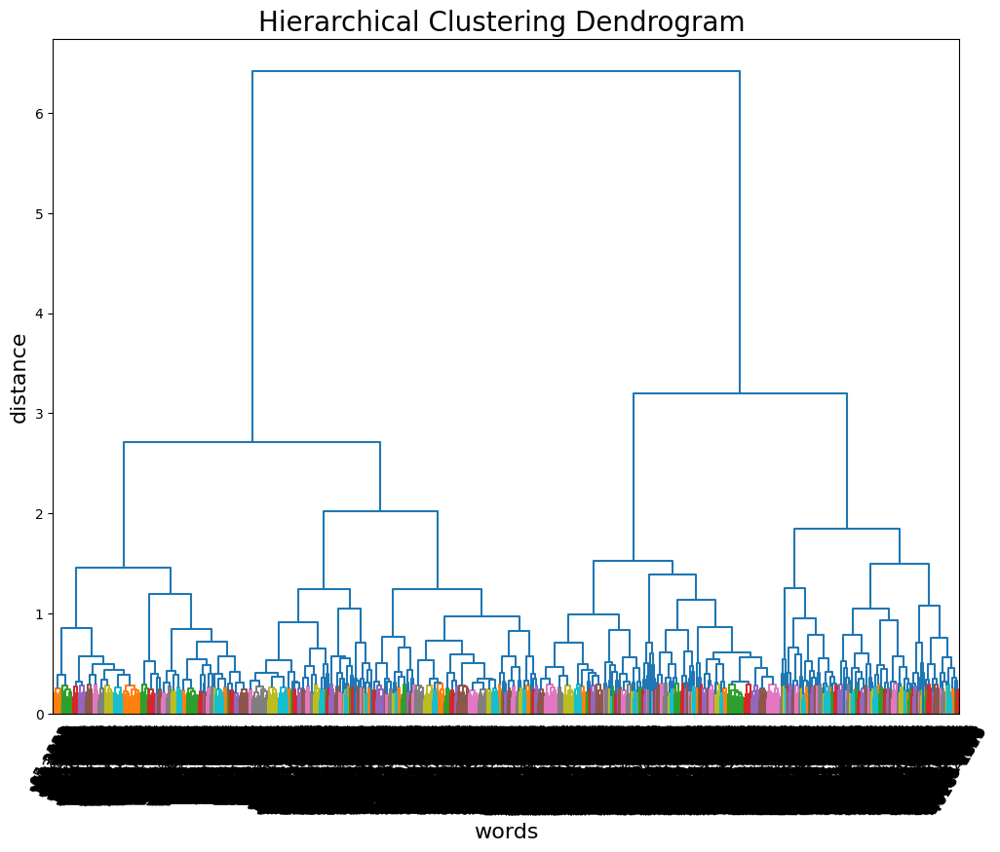

In [68]:
matrix = model.dv.vectors
#print(matrix)

from scipy.cluster.hierarchy import dendrogram, linkage
linked = linkage(matrix, 'ward')

p = len(labels2)

plt.figure(figsize=(12,9))
plt.title('Hierarchical Clustering Dendrogram ', fontsize=20)
plt.xlabel('words', fontsize=16)
plt.ylabel('distance', fontsize=16)

# call dendrogram to get the returned dictionary 
# (plotting parameters can be ignored at this point)
R = dendrogram(
                linked,
                truncate_mode='lastp',  # show only the last p merged clusters
                p=p,  # show only the last p merged clusters
                no_plot=True,
                )

#print(labels2)



## This  gives you a  label AND the count
temp = {R["leaves"][ii]:(labels2[ii], R["ivl"][ii]) for ii in range(len(R["leaves"]))}
def llf(xx):
    return "{} - {}".format(*temp[xx])

print("values passed to leaf_label_func\nleaves : ", R["leaves"])

dendrogram(
            linked,
            truncate_mode='lastp',  # show only the last p merged clusters
            p=p,  # show only the last p merged clusters
            leaf_label_func=llf,
            leaf_rotation=60.,
            color_threshold=2.5,
            leaf_font_size=12.,
            show_contracted=True,  # to get a distribution impression in truncated branches
            )
plt.show()

In [102]:
from scipy.cluster.hierarchy import fcluster
assignments = fcluster(linkage(matrix, method='complete'),0.5,'distance')

#print (assignments)

cluster_output = pd.DataFrame({'cluster':assignments})
print(cluster_output)

      cluster
0           3
1           8
2           4
3           8
4           4
5           3
6           8
7           4
8           4
9           8
10          3
11          3
12          3
13          4
14          3
15          8
16          8
17          8
18          3
19          8
20          4
21          8
22          8
23          8
24          3
25          4
26          4
27          3
28          8
29          8
30          4
31          4
32          4
33          4
34          4
35          4
36          8
37          4
38          3
39          4
40          8
41          4
42          4
43          3
44          8
45          8
46          3
47          8
48          4
49          3
50          8
51          8
52          8
53          8
54          3
55          4
56          8
57          3
58          8
59          8
60          8
61          3
62          2
63          8
64          2
65          7
66          2
67          3
68          4
69          4
70    

In [103]:
df['cluster']=cluster_output

In [104]:
df

,number,sents,text_enpunct,sents_tokenized,sents_nonstop,sents_stemmed,hadith_lemmatized,cluster
0,0,etymology of the name of andalue—climate—geogr...,etymology of the name of andalueclimategeograp...,"['etymology', 'of', 'the', 'name', 'of', 'anda...","['etymology', 'name', 'andalueclimategeographi...","['etymolog', 'name', 'andalueclimategeograph',...","['etymolog', 'name', 'andalueclimategeograph',...",3
1,0,"in the name of god, whose assistance we humbly...",in the name of god whose assistance we humbly ...,"['in', 'the', 'name', 'of', 'god', 'whose', 'a...","['name', 'god', 'whose', 'assistance', 'humbly...","['name', 'god', 'whose', 'assist', 'humbl', 'b...","['name', 'god', 'whose', 'assist', 'humbl', 'b...",8
2,1,"for our part, we consider andalus as the priz...",for our part we consider andalus as the prize...,"['', 'for', 'our', 'part', 'we', 'consider', '...","['', 'part', 'consider', 'andalus', 'prize', '...","['', 'part', 'consid', 'andalu', 'prize', 'rac...","['', 'part', 'consid', 'andalu', 'prize', 'rac...",4
3,0,especting the etymology of its name different ...,especting the etymology of its name different ...,"['especting', 'the', 'etymology', 'of', 'its',...","['especting', 'etymology', 'name', 'different'...","['espect', 'etymolog', 'name', 'differ', 'opin...","['espect', 'etymolog', 'name', 'differ', 'opin...",8
4,1,"” who settled in it, and gave it his name, in...",who settled in it and gave it his name in li...,"['', 'who', 'settled', 'in', 'it', 'and', 'gav...","['', 'settled', 'gave', 'name', 'like', 'manne...","['', 'settl', 'gave', 'name', 'like', 'manner'...","['', 'settl', 'gave', 'name', 'like', 'manner'...",4
5,2,"ibnu ghélib? follows the same opinion, but ma...",ibnu ghlib follows the same opinion but makes...,"['', 'ibnu', 'ghlib', 'follows', 'the', 'same'...","['', 'ibnu', 'ghlib', 'follows', 'opinion', 'm...","['', 'ibnu', 'ghlib', 'follow', 'opinion', 'ma...","['', 'ibnu', 'ghlib', 'follow', 'opinion', 'ma...",3
6,3,"ibnu hayyén,? ibnu khaldin,* and others, deri...",ibnu hayyn ibnu khaldin and others derive it ...,"['', 'ibnu', 'hayyn', 'ibnu', 'khaldin', 'and'...","['', 'ibnu', 'hayyn', 'ibnu', 'khaldin', 'othe...","['', 'ibnu', 'hayyn', 'ibnu', 'khaldin', 'othe...","['', 'ibnu', 'hayyn', 'ibnu', 'khaldin', 'othe...",8
7,4,this latter opinion seems the most probable ...,this latter opinion seems the most probable ...,"['', 'this', 'latter', 'opinion', 'seems', 'th...","['', 'latter', 'opinion', 'seems', 'probable',...","['', 'latter', 'opinion', 'seem', 'probabl', '...","['', 'latter', 'opinion', 'seem', 'probabl', '...",4
8,0,he country of andalus (may god restore it enti...,he country of andalus may god restore it entir...,"['he', 'country', 'of', 'andalus', 'may', 'god...","['country', 'andalus', 'may', 'god', 'restore'...","['countri', 'andalu', 'may', 'god', 'restor', ...","['countri', 'andalu', 'may', 'god', 'restor', ...",4
9,1,described both by native and foreign writers...,described both by native and foreign writers...,"['', 'described', 'both', 'by', 'native', 'and...","['', 'described', 'native', 'foreign', 'writer...","['', 'describ', 'nativ', 'foreign', 'writer', ...","['', 'describ', 'nativ', 'foreign', 'writer', ...",8


In [107]:
df.to_csv('spain_part_1_clusters2.csv', index=False, header=True)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221,

values passed to leaf_label_func
leaves :  [2450, 1290, 3395, 388, 663, 422, 3324, 2776, 2588, 2847, 336, 416, 2417, 1004, 815, 800, 3974, 1260, 2593, 446, 3612, 275, 55, 2418, 751, 2058, 123, 767, 762, 2616, 444, 742, 3709, 1383, 1052, 3291, 1718, 3604, 829, 1490, 2554, 2710, 513, 1425, 2206, 1822, 3618, 1622, 1372, 2439, 144, 2961, 3394, 3972, 2066, 189, 3971, 251, 2973, 2160, 2320, 1956, 3305, 2243, 3175, 3622, 113, 753, 1849, 1829, 1249, 1722, 1017, 3511, 3375, 3858, 2061, 734, 839, 34, 3317, 3494, 2229, 3539, 2476, 3606, 516, 3417, 314, 2227, 589, 1624, 3028, 1259, 3537, 2682, 3467, 587, 3570, 3558, 3691, 3920, 3874, 1885, 2906, 805, 3983, 356, 1813, 2367, 382, 1336, 1334, 2533, 359, 3607, 89, 3979, 3384, 1345, 1798, 648, 1543, 1192, 2214, 1922, 2018, 3783, 2303, 3816, 2491, 168, 1328, 756, 2893, 774, 673, 828, 3482, 1516, 3453, 2457, 2669, 467, 727, 3139, 549, 2816, 3664, 3722, 493, 3387, 324, 1302, 2349, 1577, 3964, 630, 2067, 2406, 427, 646, 723, 1842, 465, 1725, 2604, 868, 226

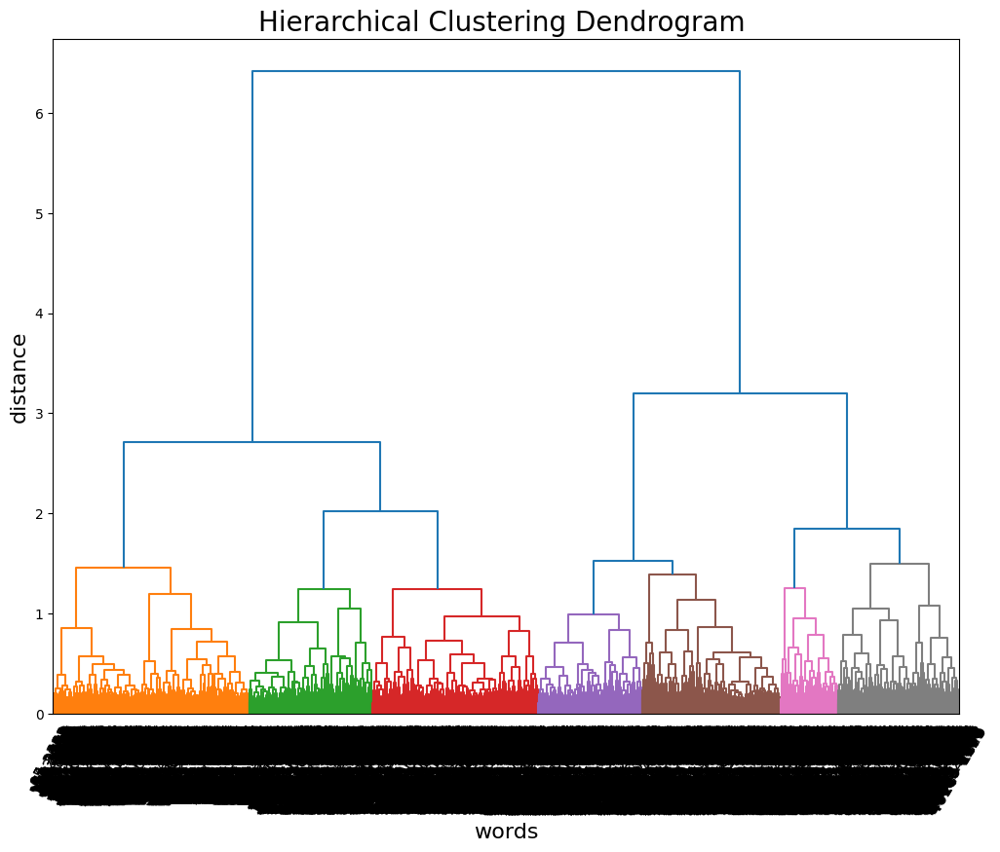

In [109]:
labels2 = model.dv.index_to_key
print(labels2)
p = len(labels2)
np.version.version
matrix = model.dv.vectors
#print(matrix)

from scipy.cluster.hierarchy import dendrogram, linkage
linked = linkage(matrix, 'ward')

p = len(labels2)

plt.figure(figsize=(12,9))
plt.title('Hierarchical Clustering Dendrogram ', fontsize=20)
plt.xlabel('words', fontsize=16)
plt.ylabel('distance', fontsize=16)

# call dendrogram to get the returned dictionary 
# (plotting parameters can be ignored at this point)
R = dendrogram(
                linked,
                truncate_mode='lastp',  # show only the last p merged clusters
                p=p,  # show only the last p merged clusters
                no_plot=True,
                )

#print(labels2)



## This  gives you a  label AND the count
temp = {R["leaves"][ii]:(labels2[ii], R["ivl"][ii]) for ii in range(len(R["leaves"]))}
def llf(xx):
    return "{} - {}".format(*temp[xx])

print("values passed to leaf_label_func\nleaves : ", R["leaves"])

dendrogram(
            linked,
            truncate_mode='lastp',  # show only the last p merged clusters
            p=p,  # show only the last p merged clusters
            leaf_label_func=llf,
            leaf_rotation=60.,
            color_threshold=1.5,
            leaf_font_size=12.,
            show_contracted=True,  # to get a distribution impression in truncated branches
            )
plt.show()

In [134]:
from scipy.cluster.hierarchy import fcluster
#assignments = fcluster(linkage(matrix, method='complete'),1.5,'distance')
assignments =fcluster(linked,7,criterion='maxclust')
#fcluster(Z, t=0.9, criterion='distance') fcluster(linked,numclust,criterion='maxclust')

print (assignments)

cluster_output = pd.DataFrame({ 'cluster':assignments})
print(cluster_output)

[7 3 2 ... 4 5 3]
      cluster
0           7
1           3
2           2
3           7
4           1
5           7
6           3
7           3
8           1
9           5
10          7
11          7
12          7
13          3
14          7
15          6
16          5
17          7
18          7
19          4
20          3
21          2
22          2
23          3
24          7
25          3
26          4
27          6
28          2
29          6
30          2
31          2
32          1
33          3
34          1
35          1
36          3
37          5
38          7
39          1
40          4
41          1
42          3
43          7
44          5
45          6
46          6
47          3
48          3
49          7
50          7
51          3
52          5
53          3
54          7
55          1
56          2
57          4
58          2
59          3
60          2
61          7
62          7
63          2
64          7
65          5
66          7
67          7
68          5
69

In [135]:
df['cluster']=cluster_output

In [136]:
df

,number,sents,text_enpunct,sents_tokenized,sents_nonstop,sents_stemmed,hadith_lemmatized,cluster
0,0,etymology of the name of andalue—climate—geogr...,etymology of the name of andalueclimategeograp...,"['etymology', 'of', 'the', 'name', 'of', 'anda...","['etymology', 'name', 'andalueclimategeographi...","['etymolog', 'name', 'andalueclimategeograph',...","['etymolog', 'name', 'andalueclimategeograph',...",7
1,0,"in the name of god, whose assistance we humbly...",in the name of god whose assistance we humbly ...,"['in', 'the', 'name', 'of', 'god', 'whose', 'a...","['name', 'god', 'whose', 'assistance', 'humbly...","['name', 'god', 'whose', 'assist', 'humbl', 'b...","['name', 'god', 'whose', 'assist', 'humbl', 'b...",3
2,1,"for our part, we consider andalus as the priz...",for our part we consider andalus as the prize...,"['', 'for', 'our', 'part', 'we', 'consider', '...","['', 'part', 'consider', 'andalus', 'prize', '...","['', 'part', 'consid', 'andalu', 'prize', 'rac...","['', 'part', 'consid', 'andalu', 'prize', 'rac...",2
3,0,especting the etymology of its name different ...,especting the etymology of its name different ...,"['especting', 'the', 'etymology', 'of', 'its',...","['especting', 'etymology', 'name', 'different'...","['espect', 'etymolog', 'name', 'differ', 'opin...","['espect', 'etymolog', 'name', 'differ', 'opin...",7
4,1,"” who settled in it, and gave it his name, in...",who settled in it and gave it his name in li...,"['', 'who', 'settled', 'in', 'it', 'and', 'gav...","['', 'settled', 'gave', 'name', 'like', 'manne...","['', 'settl', 'gave', 'name', 'like', 'manner'...","['', 'settl', 'gave', 'name', 'like', 'manner'...",1
5,2,"ibnu ghélib? follows the same opinion, but ma...",ibnu ghlib follows the same opinion but makes...,"['', 'ibnu', 'ghlib', 'follows', 'the', 'same'...","['', 'ibnu', 'ghlib', 'follows', 'opinion', 'm...","['', 'ibnu', 'ghlib', 'follow', 'opinion', 'ma...","['', 'ibnu', 'ghlib', 'follow', 'opinion', 'ma...",7
6,3,"ibnu hayyén,? ibnu khaldin,* and others, deri...",ibnu hayyn ibnu khaldin and others derive it ...,"['', 'ibnu', 'hayyn', 'ibnu', 'khaldin', 'and'...","['', 'ibnu', 'hayyn', 'ibnu', 'khaldin', 'othe...","['', 'ibnu', 'hayyn', 'ibnu', 'khaldin', 'othe...","['', 'ibnu', 'hayyn', 'ibnu', 'khaldin', 'othe...",3
7,4,this latter opinion seems the most probable ...,this latter opinion seems the most probable ...,"['', 'this', 'latter', 'opinion', 'seems', 'th...","['', 'latter', 'opinion', 'seems', 'probable',...","['', 'latter', 'opinion', 'seem', 'probabl', '...","['', 'latter', 'opinion', 'seem', 'probabl', '...",3
8,0,he country of andalus (may god restore it enti...,he country of andalus may god restore it entir...,"['he', 'country', 'of', 'andalus', 'may', 'god...","['country', 'andalus', 'may', 'god', 'restore'...","['countri', 'andalu', 'may', 'god', 'restor', ...","['countri', 'andalu', 'may', 'god', 'restor', ...",1
9,1,described both by native and foreign writers...,described both by native and foreign writers...,"['', 'described', 'both', 'by', 'native', 'and...","['', 'described', 'native', 'foreign', 'writer...","['', 'describ', 'nativ', 'foreign', 'writer', ...","['', 'describ', 'nativ', 'foreign', 'writer', ...",5


In [137]:
df.to_csv('spain_part_1_clusters3.csv', index=False, header=True)